In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go

%matplotlib inline

In [2]:
from kaggle.competitions import twosigmanews
env = twosigmanews.make_env()

Loading the data... This could take a minute.
Done!


In [3]:
(market_train_df, news_train_df) = env.get_training_data()

In [4]:
market_train_df.head()

,time,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe
0,2007-02-01 22:00:00+00:00,A.N,Agilent Technologies Inc,2606900.0,32.19,32.17,0.005938,0.005312,NaN,NaN,-0.001860,0.000622,NaN,NaN,0.034672,1.0
1,2007-02-01 22:00:00+00:00,AAI.N,AirTran Holdings Inc,2051600.0,11.12,11.08,0.004517,-0.007168,NaN,NaN,-0.078708,-0.088066,NaN,NaN,0.027803,0.0
2,2007-02-01 22:00:00+00:00,AAP.N,Advance Auto Parts Inc,1164800.0,37.51,37.99,-0.011594,0.025648,NaN,NaN,0.014332,0.045405,NaN,NaN,0.024433,1.0
3,2007-02-01 22:00:00+00:00,AAPL.O,Apple Inc,23747329.0,84.74,86.23,-0.011548,0.016324,NaN,NaN,-0.048613,-0.037182,NaN,NaN,-0.007425,1.0
4,2007-02-01 22:00:00+00:00,ABB.N,ABB Ltd,1208600.0,18.02,18.01,0.011791,0.025043,NaN,NaN,0.012929,0.020397,NaN,NaN,-0.017994,1.0


In [5]:
market_train_df.tail()

,time,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe
4072951,2016-12-30 22:00:00+00:00,ZIOP.O,ZIOPHARM Oncology Inc,1608829.0,5.35,5.37,-0.003724,0.000000,0.000536,-0.001868,-0.165367,-0.138042,-0.139597,-0.135913,0.051189,0.0
4072952,2016-12-30 22:00:00+00:00,ZLTQ.O,ZELTIQ Aesthetics Inc,347830.0,43.52,43.62,-0.000689,0.000000,-0.000515,0.000493,0.002996,0.002989,0.008213,0.003210,-0.048555,0.0
4072953,2016-12-30 22:00:00+00:00,ZNGA.O,Zynga Inc,7396601.0,2.57,2.58,-0.011538,0.000000,-0.006004,-0.001034,-0.091873,-0.078571,-0.077252,-0.077188,0.011703,0.0
4072954,2016-12-30 22:00:00+00:00,ZTO.N,Unknown,3146519.0,12.07,12.50,-0.029743,0.007252,-0.028460,0.006719,-0.065066,-0.042146,-0.078104,-0.043813,0.083367,1.0
4072955,2016-12-30 22:00:00+00:00,ZTS.N,Zoetis Inc,1701204.0,53.53,53.64,-0.001678,0.003091,0.005060,0.002885,0.023127,0.028177,0.026566,0.028719,-0.016220,1.0


In [6]:
news_train_df.head()

,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,audiences,bodySize,companyCount,headlineTag,marketCommentary,sentenceCount,wordCount,assetCodes,assetName,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D
0,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,e58c6279551b85cf,China's Daqing pumps 43.41 mln tonnes of oil i...,3,1,RTRS,"{'ENR', 'ASIA', 'CN', 'NGS', 'EMRG', 'RTRS', '...","{'Z', 'O', 'OIL'}",1438,1,,False,11,275,"{'0857.HK', '0857.F', '0857.DE', 'PTR.N'}",PetroChina Co Ltd,6,0.235702,-1,0.500739,0.419327,0.079934,73,0,0,0,0,0,0,0,3,6,7
1,2007-01-01 07:03:35+00:00,2007-01-01 07:03:34+00:00,2007-01-01 07:03:34+00:00,5a31c4327427f63f,"FEATURE-In kidnapping, finesse works best",3,1,RTRS,"{'FEA', 'CA', 'LATAM', 'MX', 'INS', 'ASIA', 'I...","{'PGE', 'PCO', 'G', 'ESN', 'MD', 'PCU', 'DNP',...",4413,1,FEATURE,False,55,907,{'STA.N'},Travelers Companies Inc,8,0.447214,-1,0.600082,0.345853,0.054064,62,1,1,1,1,1,1,1,3,3,3
2,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,1cefd27a40fabdfe,PRESS DIGEST - Wall Street Journal - Jan 1,3,1,RTRS,"{'RET', 'ENR', 'ID', 'BG', 'US', 'PRESS', 'IQ'...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",2108,2,PRESS DIGEST,False,15,388,"{'WMT.DE', 'WMT.N'}",Wal-Mart Stores Inc,14,0.377964,-1,0.450049,0.295671,0.254280,67,0,0,0,0,0,0,0,5,11,17
3,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,"{'GOOG.O', 'GOOG.OQ', 'GOOGa.DE'}",Google Inc,13,0.149071,-1,0.752917,0.162715,0.084368,83,0,0,0,0,0,0,0,5,13,15
4,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,{'XMSR.O'},XM Satellite Radio Holdings Inc,11,0.149071,-1,0.699274,0.209360,0.091366,102,0,0,0,0,0,0,0,0,0,0


In [7]:
news_train_df.tail()

,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,audiences,bodySize,companyCount,headlineTag,marketCommentary,sentenceCount,wordCount,assetCodes,assetName,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D
9328745,2016-12-30 21:56:06+00:00,2016-12-30 21:56:06+00:00,2016-12-30 21:56:06+00:00,fc80724160cc7bf4,"INTREXON - ON DEC 30, CO, THIRD SECURITY EXECU...",1,1,RTRS,"{'BLR', 'HECA', 'PHMR', 'MRCH', 'US', 'RTRS', ...","{'E', 'U'}",0,1,,False,1,35,{'XON.N'},Intrexon Corp,1,1.0,1,0.115706,0.410445,0.473849,35,0,0,0,0,0,0,1,10,10,10
9328746,2016-12-30 21:56:28+00:00,2016-12-30 21:56:28+00:00,2016-12-30 21:56:06+00:00,2e3e5407e186dd51,INTREXON CORP - AMENDMENT EXTENDS TERM OF SERV...,1,2,RTRS,"{'BLR', 'DBT', 'HECA', 'PHMR', 'MRCH', 'BACT',...","{'E', 'U'}",0,1,,False,1,20,{'XON.N'},Intrexon Corp,1,1.0,1,0.032272,0.122635,0.845093,20,0,0,1,1,1,1,2,11,11,11
9328747,2016-12-30 21:57:00+00:00,2016-12-30 21:57:00+00:00,2016-12-30 21:57:00+00:00,cef1bb88f92ca104,EQUITY ALERT: Rosen Law Firm Announces Investi...,3,1,BSW,"{'CMSS', 'CLJ', 'GEN', 'NEWR', 'HECA', 'PHMR',...","{'BSW', 'CNR'}",3734,1,,False,16,664,"{'SGEN.O', 'SGEN.OQ'}",Seattle Genetics Inc,1,1.0,-1,0.651900,0.227707,0.120393,360,0,0,3,4,4,1,2,18,41,41
9328748,2016-12-30 21:58:53+00:00,2016-12-30 21:58:53+00:00,2016-12-30 21:58:53+00:00,c26c3df1804571a6,PROFESSIONAL DIVERSITY NETWORK INC - FILES FOR...,1,1,RTRS,"{'BLR', 'SWIT', 'ITSE', 'SISU', 'BACT', 'TMT',...","{'E', 'U'}",0,1,,False,1,23,"{'IPDN.O', 'IPDN.OQ'}",Professional Diversity Network Inc,1,1.0,-1,0.816252,0.126928,0.056819,23,0,0,0,0,0,0,0,3,3,3
9328749,2016-12-30 22:00:00+00:00,2016-12-30 22:00:00+00:00,2016-12-30 22:00:00+00:00,daea2d46dc7f5303,"JPMorgan China Region Fund, Inc. Board to Subm...",3,1,BSW,"{'CMSS', 'NEWR', 'INVT', 'BACT', 'BSUP', 'INDS...","{'BSW', 'CNR'}",2969,1,,False,15,492,{'JFC.N'},JPMorgan China Region Fund Inc,1,1.0,1,0.130152,0.388845,0.481002,383,0,0,0,0,0,0,0,0,0,0



# Exploratory Data Analysis

In [8]:
print ('The market_train dataframe has a total of', 
       market_train_df.shape[0], 'data points and', market_train_df.shape[1], 'features.')

The market_train dataframe has a total of 4072956 data points and 16 features.


In [9]:
#Get a statistical summary for the market_train dataset
market_train_df.describe()

,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe
count,4.072956e+06,4.072956e+06,4.072956e+06,4.072956e+06,4.072956e+06,4.056976e+06,4.056968e+06,4.072956e+06,4.072956e+06,3.979946e+06,3.979902e+06,4.072956e+06,4.072956e+06
mean,2.665312e+06,3.971241e+01,3.971233e+01,5.473026e-04,9.569113e-03,1.738580e-04,9.309293e-03,5.232021e-03,1.423685e-02,1.638857e-03,1.481702e-02,1.405528e-02,5.949365e-01
std,7.687606e+06,4.228822e+01,4.261116e+01,3.697774e-02,7.084388e+00,3.270305e-02,6.968866e+00,8.872484e-02,7.123552e+00,7.517820e-02,7.285742e+00,7.242467e+00,4.909044e-01
min,0.000000e+00,7.000000e-02,1.000000e-02,-9.776464e-01,-9.998881e-01,-1.235622e+00,-6.158463e+02,-9.774034e-01,-9.998904e-01,-3.343277e+00,-1.375045e+03,-1.375045e+03,0.000000e+00
25%,4.657968e+05,1.725000e+01,1.725000e+01,-1.089241e-02,-1.108987e-02,-8.569246e-03,-1.002114e-02,-3.339148e-02,-3.337574e-02,-2.927584e-02,-2.962645e-02,-2.970509e-02,0.000000e+00
50%,9.821000e+05,3.030000e+01,3.029000e+01,3.373819e-04,3.824092e-04,-1.236127e-04,-3.356938e-06,5.160339e-03,5.165128e-03,8.329261e-04,1.126206e-03,1.044642e-03,1.000000e+00
75%,2.403165e+06,4.986000e+01,4.985000e+01,1.165695e-02,1.183612e-02,8.397528e-03,1.002712e-02,4.297606e-02,4.298507e-02,3.059022e-02,3.171535e-02,3.152750e-02,1.000000e+00
max,1.226791e+09,1.578130e+03,9.998990e+03,4.559245e+01,9.209000e+03,4.512244e+01,8.989207e+03,4.667181e+01,9.382000e+03,4.624971e+01,9.761338e+03,9.761338e+03,1.000000e+00


In [10]:
#Checking null values in the market dataframe
market_train_df.isnull().any()

time                        False
assetCode                   False
assetName                   False
volume                      False
close                       False
open                        False
returnsClosePrevRaw1        False
returnsOpenPrevRaw1         False
returnsClosePrevMktres1      True
returnsOpenPrevMktres1       True
returnsClosePrevRaw10       False
returnsOpenPrevRaw10        False
returnsClosePrevMktres10     True
returnsOpenPrevMktres10      True
returnsOpenNextMktres10     False
universe                    False
dtype: bool

In [11]:
#Get the data type for each column of the market_train df
market_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4072956 entries, 0 to 4072955
Data columns (total 16 columns):
time                        datetime64[ns, UTC]
assetCode                   object
assetName                   category
volume                      float64
close                       float64
open                        float64
returnsClosePrevRaw1        float64
returnsOpenPrevRaw1         float64
returnsClosePrevMktres1     float64
returnsOpenPrevMktres1      float64
returnsClosePrevRaw10       float64
returnsOpenPrevRaw10        float64
returnsClosePrevMktres10    float64
returnsOpenPrevMktres10     float64
returnsOpenNextMktres10     float64
universe                    float64
dtypes: category(1), datetime64[ns, UTC](1), float64(13), object(1)
memory usage: 474.1+ MB


Since we have two different dataset in this study, let's explore them separately before building any models. 

## Market Data

In [12]:
#Get a statistical total volume for each assetCode
assetCode_volume_total = {}
for group in market_train_df.groupby('assetCode'):
    assetCode = group[0]
    total_volume = sum(group[1].volume)
    assetCode_volume_total[assetCode] = total_volume

In [13]:
import numpy as np 
import pandas as pd

#Print out the list of top 10 assetCode with the highest number of volumes
assetCode_volume_total_df = pd.DataFrame.from_dict(assetCode_volume_total, orient='index', columns=['total_volume'])
assetCode_volume_total_df = assetCode_volume_total_df.sort_values(by='total_volume', ascending=False).reset_index()
assetCode_volume_total_df.columns = ['assetCode', 'total_volume']
assetCode_volume_total_df.head(10)

,assetCode,total_volume
0,BAC.N,3.601165e+11
1,GE.N,1.438696e+11
2,F.N,1.336455e+11
3,MSFT.O,1.321638e+11
4,INTC.O,1.233342e+11
5,CSCO.O,1.144949e+11
6,PFE.N,1.011882e+11
7,WFC.N,8.645566e+10
8,JPM.N,7.891265e+10
9,AAPL.O,7.288006e+10


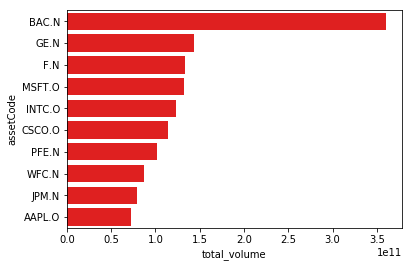

In [14]:
#Visualize the number of total volume by assetCode for the top 10
import seaborn as sns
sns.barplot(y='assetCode', x='total_volume', data=assetCode_volume_total_df[:10], 
           color='red')

In [15]:
main_assetCode = list(assetCode_volume_total_df.assetCode[:10])
main_assetCode

['BAC.N',
 'GE.N',
 'F.N',
 'MSFT.O',
 'INTC.O',
 'CSCO.O',
 'PFE.N',
 'WFC.N',
 'JPM.N',
 'AAPL.O']

In [16]:
market_train_df_top10_volume = market_train_df[market_train_df.assetCode.isin(main_assetCode)]

top10_vol_close_data = []
for label, df in market_train_df_top10_volume.groupby('assetCode'):
    time = df['time'].dt.strftime(date_format='%Y-%m-%d').values
    close_val = df['close'].values
    top10_vol_close_data.append(go.Scatter(x = time, 
                                     y = close_val, 
                                    name = label))
layout = go.Layout(dict(title = 'Closing Price for the top 10 companies with the highest volume', 
                       xaxis = dict(title = 'Month'), 
                       yaxis = dict(title = 'Price (USD)'), 
                       ), legend=dict(orientation='h'))
py.iplot(dict(data=top10_vol_close_data, layout=layout), filename='basic-line')

It is very interesting that there seems to be a huge gap in the closing price of APPL.O in May of 2014 versus June of 2014. Let's take a look at the open price of these same companies to determine if there is indeed a drop in stock price of APPL.O between these two months. 

In [17]:
top10_vol_open_data = []
for label, df in market_train_df_top10_volume.groupby('assetCode'):
    time = df['time'].dt.strftime(date_format='%Y-%m-%d').values
    open_val = df['open'].values
    top10_vol_open_data.append(go.Scatter(x = time,
                                          y = open_val, 
                                         name = label))
layout = go.Layout(dict(title = 'Open Price for the top 10 companies with the highest volume', 
                        xaxis = dict(title = 'Month'),
                        yaxis = dict(title = 'Open Price (USD)')), 
                        legend = dict(orientation = 'h'))
py.iplot(dict(data = top10_vol_open_data, layout = layout))
                


After checking on the open price of the APPL.O stock price, we also noticed that the open stock price also has a huge drop between May and June of  2014. Since this is quite strange of a jump, I went online and dug into some of the online news during that period of time. I found that on June 9 of 2014, Apple splitted its stock into something called 7-for-1 split, whichmeans for every share of Apple stock you own, you would get six more even though the stock price dropped from $650 to $92 each. So this kind of gap that we see in my analysis is a legitimate gap and is not an error in the dataset! Since APPL.O's stock price is very high in comparison to the other companies, it probably would be ideal to exclude this assetCode from the list of top 10 companies with highest volume to get a better picture. 



In [18]:
top10_vol_data_without_APPLO = market_train_df_top10_volume[market_train_df_top10_volume['assetCode']!='AAPL.O']

In [19]:
top10_vol_open_without_APPLO = []
top10_vol_close_without_APPLO = []

for label, df in top10_vol_data_without_APPLO.groupby('assetCode'):
    time = df['time'].dt.strftime(date_format='%Y-%m-%d').values
    open_val = df['open'].values
    close_val = df['close'].values
    top10_vol_open_without_APPLO.append(go.Scatter(x=time, y=open_val, name=label))
    top10_vol_close_without_APPLO.append(go.Scatter(x=time, y=close_val, name=label))

layout1 = go.Layout(dict(title='Open Price of top 10 highest volume companies without APPL.O', 
                        xaxis=dict(title='Month'), 
                        yaxis=dict(title='Close Price (USD)')),
                    legend=dict(orientation='h'))

layout2 = go.Layout(dict(title='Closing Price of top 10 highest volume companies without APPL.O', 
                        xaxis=dict(title='Month'), 
                        yaxis=dict(title='Open Price (USD)')), 
                        legend=dict(orientation='h'))


py.iplot(dict(data=top10_vol_open_without_APPLO, layout=layout1))
py.iplot(dict(data=top10_vol_close_without_APPLO, layout=layout2))

The trends in the two graphs that represent both close and open price for the 9 companies with the higest trading volume seem to be very similar, which makes a complete sense. We can clearly see the collapse of Lehman Brothers during the year of 2008 in the graph, which lingers for a while. This period of time is represented by a deep shallow between the year of 2008-2010. Another significant shallow that we can also see in these graphs is towards the end of the year 2011, which marks the event of Black Monday 2011 in the fiance and investing industry. This event refers to August 8, 2011, when the US and global stock market crashed and it was also the first time in the history the US was downgraded. 


Now, let's shift our focus to the target variable of this study, which is the returnsOpenNextMktres10 variable. However, instead of focusing on the top highest trading volume companies, we will select randomly 20 companies and look at their retunrsOpenNextMktres10 fluctuation. The variable NextMktres10 represents the returns that are calculated from the opening time of one trading to the open of another day during a 10-day horizon interval and also accounted for the movement of the market as a whole (market-residualized) in a forward-looking timeframe. 

In [20]:
random_assetCode = np.random.choice(market_train_df.assetCode.unique(), 20)

In [21]:
random_assetCode_df = market_train_df[market_train_df['assetCode'].isin(random_assetCode)]

In [22]:
random_assetCode_returnsOpenNextMktres10_data = []
for label, df in random_assetCode_df.groupby('assetCode'):
    time = df['time'].dt.strftime(date_format = '%Y-%m-%d').values
    returnsOpenNextMktres10 = df['returnsOpenNextMktres10'].values
    random_assetCode_returnsOpenNextMktres10_data.append(go.Scatter(x=time, 
                                                                   y=returnsOpenNextMktres10, 
                                                                   name=label))
layout = go.Layout(dict(title = 'Market-Residualized Returns Based on Open-to-Open and 10-days Interval'), 
                  xaxis=dict(title='Month'), 
                  yaxis=dict(title='returnsOpenNextMktres10 (USD)'), 
                  legend=dict(orientation='h'))
py.iplot(dict(data=random_assetCode_returnsOpenNextMktres10_data, layout=layout))

According to the graph above, we can see the obvious fluctutation in the returns during the collapse of Lehman Brothers back in 2008, which is the biggest crisis that got identified so far. Let's now take a look a the stock price difference between open and close for each assetCode. 

Text(0.5,1,'Average Price Difference Over Time')

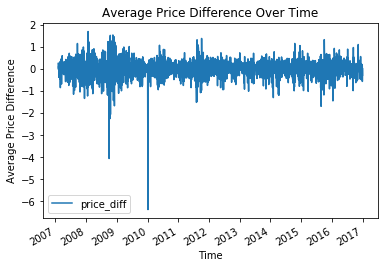

In [23]:
#Calculate the price difference using stock open and stock close price
market_train_df['price_diff'] = market_train_df['close'] - market_train_df['open']

#Group the price difference based on month of year
price_diff_overtime = market_train_df.groupby('time').agg({'price_diff':'mean'}).reset_index()
price_diff_overtime.plot(x='time', y='price_diff')
plt.xlabel('Time')
plt.ylabel('Average Price Difference')
plt.title('Average Price Difference Over Time')

The above pointed out to us that there are two different time periods that we get a very huge price difference between the open and close price; however, according to our analysis so far, the collapse of the Lehman Brothers should be the only biggest crisis and thus the first dip in between 2008 and 2009 makes sense. However, the decond dip that occurs during the  year of 2010 does not get justified by any known public social event in the financial industry and could possible be due to data error. 

In [24]:
market_train_df.sort_values('price_diff').head(10)

,time,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe,price_diff
1127598,2010-01-04 22:00:00+00:00,TW.N,Towers Watson & Co,223136.0,50.00,9998.9900,-0.058470,185.988360,-0.056911,163.671298,-0.024316,189.918708,0.034162,188.184866,13.167586,0.0,-9948.9900
627547,2008-09-29 22:00:00+00:00,BK.N,Bank of New York Mellon Corp,18718479.0,26.50,3288.1136,-0.271578,99.125262,-0.064067,98.933405,-0.275164,84.405548,-0.189620,83.371024,4.061628,1.0,-3261.6136
502997,2008-06-05 22:00:00+00:00,AHG.N,Apria Healthcare Group Inc,801892.0,17.29,999.9900,0.009930,58.523214,-0.001831,58.449248,0.104792,62.410907,0.140881,54.556118,-4.176442,0.0,-982.7000
471381,2008-05-06 22:00:00+00:00,CEPH.O,Cephalon Inc,4846.0,61.04,999.9900,0.014628,15.547907,0.009554,14.982480,-0.039950,14.742916,-0.053743,14.824286,0.087719,1.0,-938.9500
242847,2007-09-27 22:00:00+00:00,EXH.N,Archrock Inc,490100.0,79.99,999.9900,0.022236,11.658101,0.018789,11.570153,0.007304,11.618170,0.012866,552.522473,-0.550395,1.0,-920.0000
3264631,2015-03-16 22:00:00+00:00,TECD.O,Tech Data Corp,674385.0,56.59,263.8000,0.036447,3.868057,0.020318,3.781770,-0.066172,3.442573,-0.021922,3.284477,0.072616,0.0,-207.2100
7273,2007-02-08 22:00:00+00:00,BA.N,Boeing Co,5155700.0,89.52,200.0000,-0.009186,1.207749,-0.006835,1.202170,0.043010,1.299798,NaN,NaN,0.004434,1.0,-110.4800
375899,2008-02-06 22:00:00+00:00,CME.N,CME Group Inc,8676040.0,485.25,583.4900,-0.175866,-0.061536,-0.165490,-0.023137,-0.204495,0.025448,-0.188712,-0.021896,-0.006932,1.0,-98.2400
628075,2008-09-29 22:00:00+00:00,IBM.N,International Business Machines Corp,9586679.0,114.46,191.9800,-0.041534,0.637915,0.018300,0.634691,-0.006337,0.664182,0.010630,0.666148,0.013094,1.0,-77.5200
3565205,2015-11-20 22:00:00+00:00,CMG.N,Chipotle Mexican Grill Inc,5023617.0,536.19,612.0000,-0.123171,0.027863,-0.123970,0.028139,-0.124445,0.004926,NaN,NaN,-0.001849,0.0,-75.8100


By sorting the price difference column, we noticed that Towers Watson and Co has a huge price difference (almost $10000 in difference) on the 4th of Jan in 2010. We can pull up the historical data of this company to see whether it is true. Based on Yahoo fiance, the close price of Towers Watson and Co should be 43.46 with the adjusted close price of 38.38. That means, this data has an error and should be elimited or fixed before further analysis. Another four data points that are suspicious are related to the following companies:

+ Bank of New York Mellon Corp (2008-09-29)
+ Apria Healthcare Group Inc (2008-06-05)
+ Cephalon Inc (2008-06-05)
+ Archrock Inc (2007-09-27)

However, when we look at the time of when these differences happened, it makes perfect sense since that is also when the collapse of the Lehman Brothers happened. A good way to find all errors in the dataset would be to take the ratio between the close price and the open price in the same day. If the close price increases or decreases twice or more the open price, then we classify that data point as an eror and replace it with the medium of the open or the median of the close price column according. Median value is chosen instead of mean value because of the heavily skewness of the given dataset in term of the close/open price. 


In [25]:
market_train_df['close_to_open'] = market_train_df['close']/market_train_df['open']

print ('The number of assetCode that has close price twice or more than twice greater than the open price is', 
       len(market_train_df[market_train_df['close_to_open'] >= 2.0]))
print ('The number of assetCode that has close price twice or more then twice less than the open price is', 
       len(market_train_df[market_train_df['close_to_open'] <= 0.5]))

The number of assetCode that has close price twice or more than twice greater than the open price is 38
The number of assetCode that has close price twice or more then twice less than the open price is 16


In [26]:
market_train_df.sort_values('close_to_open', ascending=False).head()

,time,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe,price_diff,close_to_open
92477,2007-05-03 22:00:00+00:00,PBRa.N,Petroleo Brasileiro SA Petrobras,1360303.0,91.20,0.01,0.010974,-0.999888,0.000216,-0.959594,-0.002952,-0.999890,0.008826,-1.019173,175.431640,1.0,91.19,9120.0
206676,2007-08-23 22:00:00+00:00,EXH.N,Archrock Inc,742700.0,76.25,0.01,-0.025559,-0.999870,-0.024610,-0.982473,0.004057,-0.999869,-0.011510,-0.973421,46.924147,1.0,76.24,7625.0
276388,2007-10-30 22:00:00+00:00,ATPG.O,ATP Oil & Gas Corp,651547.0,54.56,0.01,-0.036042,-0.999821,-0.027901,-1.000330,-0.008361,-0.999819,-0.004381,-0.993821,-979.306501,0.0,54.55,5456.0
588960,2008-08-22 22:00:00+00:00,TX.N,Ternium SA,445629.0,35.01,0.01,0.011850,-0.999712,0.004869,-0.997425,0.019214,-0.999705,0.017987,-1.001684,-128.935769,1.0,35.00,3501.0
616236,2008-09-18 22:00:00+00:00,ABV.N,Companhia de Bebidas das Americas Ambev,1194746.0,51.69,0.02,0.028861,-0.999625,-0.011357,-0.759104,-0.112161,-0.999665,-0.074563,-0.461161,756.108132,1.0,51.67,2584.5


In [27]:
close_median = market_train_df['close'].median()
open_median = market_train_df['open'].median()
market_train_df.loc[market_train_df['close_to_open'] >= 2.0, 'close'] = close_median
market_train_df.loc[market_train_df['close_to_open'] <= 0.5, 'open'] = open_median

In [28]:
market_train_df['updated_price_difference'] = market_train_df['close'] - market_train_df['open']
market_train_df['updated_close_to_open'] = market_train_df['close']/market_train_df['open']
market_train_df.sort_values('close_to_open', ascending=False).head(10)

,time,assetCode,assetName,volume,close,open,returnsClosePrevRaw1,returnsOpenPrevRaw1,returnsClosePrevMktres1,returnsOpenPrevMktres1,returnsClosePrevRaw10,returnsOpenPrevRaw10,returnsClosePrevMktres10,returnsOpenPrevMktres10,returnsOpenNextMktres10,universe,price_diff,close_to_open,updated_price_difference,updated_close_to_open
92477,2007-05-03 22:00:00+00:00,PBRa.N,Petroleo Brasileiro SA Petrobras,1360303.0,30.3,0.01,0.010974,-0.999888,0.000216,-0.959594,-0.002952,-0.999890,0.008826,-1.019173,175.431640,1.0,91.19,9120.000000,30.29,3030.000000
206676,2007-08-23 22:00:00+00:00,EXH.N,Archrock Inc,742700.0,30.3,0.01,-0.025559,-0.999870,-0.024610,-0.982473,0.004057,-0.999869,-0.011510,-0.973421,46.924147,1.0,76.24,7625.000000,30.29,3030.000000
276388,2007-10-30 22:00:00+00:00,ATPG.O,ATP Oil & Gas Corp,651547.0,30.3,0.01,-0.036042,-0.999821,-0.027901,-1.000330,-0.008361,-0.999819,-0.004381,-0.993821,-979.306501,0.0,54.55,5456.000000,30.29,3030.000000
588960,2008-08-22 22:00:00+00:00,TX.N,Ternium SA,445629.0,30.3,0.01,0.011850,-0.999712,0.004869,-0.997425,0.019214,-0.999705,0.017987,-1.001684,-128.935769,1.0,35.00,3501.000000,30.29,3030.000000
616236,2008-09-18 22:00:00+00:00,ABV.N,Companhia de Bebidas das Americas Ambev,1194746.0,30.3,0.02,0.028861,-0.999625,-0.011357,-0.759104,-0.112161,-0.999665,-0.074563,-0.461161,756.108132,1.0,51.67,2584.500000,30.28,1515.000000
165718,2007-07-16 22:00:00+00:00,RRR.N,RSC Holdings Inc,335700.0,30.3,0.01,0.009128,-0.999535,0.011301,-0.993804,0.105500,-0.999503,NaN,NaN,-482.822137,0.0,22.10,2211.000000,30.29,3030.000000
25574,2007-02-27 22:00:00+00:00,TEO.N,Telecom Argentina SA,585400.0,30.3,0.01,-0.073993,-0.999558,-0.006197,-0.989573,-0.027586,-0.999545,0.038085,-1.027268,-43.043189,0.0,21.14,2115.000000,30.29,3030.000000
555738,2008-07-24 22:00:00+00:00,RGC.N,Regal Entertainment Group,1905610.0,30.3,0.01,0.011743,-0.999378,0.024164,-0.997430,0.086985,-0.999332,0.087970,-0.887309,-7.551721,1.0,16.36,1637.000000,30.29,3030.000000
50031,2007-03-22 22:00:00+00:00,PBR.N,Petroleo Brasileiro SA Petrobras,3869540.0,30.3,0.21,0.013395,-0.997675,0.014126,-0.894734,0.059015,-0.997645,0.018241,-0.922537,1.442386,1.0,94.36,450.333333,30.09,144.285714
56387,2007-03-29 22:00:00+00:00,AES.N,AES Corp,3184100.0,30.3,0.05,0.013979,-0.997678,0.008223,-0.945556,0.049180,-0.997569,0.009903,-0.998718,-22.690367,1.0,21.71,435.200000,30.25,606.000000


After replacing suspcious data points with the median value of the appropriate column, we noticed a signigicant change in the ratio between close and open price. Now let's group the price difference by the month of the year and graph the dataset to see what patterns we would get. 

Text(0.5,1,'Updated Average Price Difference Over Time')

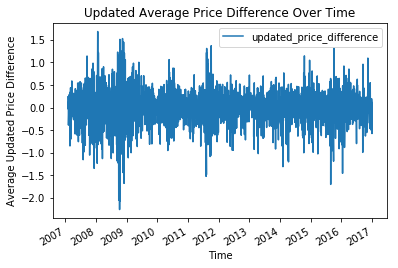

In [29]:
updated_price_diff_overtime = market_train_df.groupby('time').agg({'updated_price_difference':'mean'}).reset_index()
updated_price_diff_overtime.plot(x='time', y='updated_price_difference')
plt.xlabel('Time')
plt.ylabel('Average Updated Price Difference')
plt.title('Updated Average Price Difference Over Time')

After fixing the dataset by imputing the suspicious data points by the appropriate median value we obtained a much cleaer average price difference change overtime. In the figure above, we can clearly see the effect of the collapse of Lehman Brothers in 2008 and Black MOnday 2011 on the stock market price difference fluctutation. Let's now explore our second dataset which is the news dataset. 

## News Data

In [30]:
print ('The news_train dataframe has a total of', 
      news_train_df.shape[0], 'data points and', news_train_df.shape[1], 'features.')

The news_train dataframe has a total of 9328750 data points and 35 features.


In [31]:
news_train_df.describe()

,urgency,takeSequence,bodySize,companyCount,sentenceCount,wordCount,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D
count,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06,9.328750e+06
mean,2.321202e+00,2.122825e+00,3.768918e+03,5.027720e+00,2.250942e+01,5.804340e+02,4.817400e+00,7.428699e-01,8.614659e-02,2.723192e-01,3.661662e-01,3.564065e-01,2.175898e+02,1.385130e+00,1.587036e+00,2.122713e+00,2.574199e+00,3.170360e+00,8.522672e+00,1.230676e+01,2.206458e+01,3.008566e+01,4.050544e+01
std,9.470095e-01,2.944505e+00,7.475653e+03,8.787980e+00,3.601975e+01,9.580591e+02,1.217714e+01,3.814900e-01,8.257177e-01,2.855101e-01,2.454459e-01,2.585451e-01,3.885557e+02,8.220864e+00,8.533866e+00,1.071454e+01,1.295648e+01,1.657174e+01,2.930322e+01,3.436895e+01,5.431875e+01,6.990158e+01,8.948574e+01
min,1.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,1.258400e-03,-1.000000e+00,6.296000e-03,1.118670e-01,1.610960e-02,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,2.000000e+01,1.000000e+00,3.535530e-01,-1.000000e+00,3.428290e-02,1.391480e-01,1.723570e-01,2.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,3.000000e+00,4.000000e+00
50%,3.000000e+00,1.000000e+00,1.571000e+03,1.000000e+00,1.000000e+01,2.590000e+02,1.000000e+00,1.000000e+00,0.000000e+00,1.492690e-01,3.003090e-01,2.476800e-01,8.500000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,5.000000e+00,8.000000e+00,1.000000e+01,1.300000e+01
75%,3.000000e+00,2.000000e+00,4.504000e+03,5.000000e+00,3.000000e+01,7.650000e+02,2.000000e+00,1.000000e+00,1.000000e+00,5.328630e-01,5.831770e-01,5.521280e-01,2.450000e+02,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,2.000000e+00,9.000000e+00,1.300000e+01,2.200000e+01,3.000000e+01,4.100000e+01
max,3.000000e+00,9.700000e+01,1.227700e+05,4.300000e+01,1.205000e+03,2.026300e+04,9.890000e+02,1.000000e+00,1.000000e+00,8.197120e-01,9.277710e-01,8.569400e-01,1.308700e+04,5.000000e+02,5.000000e+02,5.000000e+02,5.000000e+02,5.000000e+02,2.564000e+03,2.569000e+03,2.586000e+03,2.599000e+03,2.974000e+03


In [32]:
news_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9328750 entries, 0 to 9328749
Data columns (total 35 columns):
time                    datetime64[ns, UTC]
sourceTimestamp         datetime64[ns, UTC]
firstCreated            datetime64[ns, UTC]
sourceId                object
headline                object
urgency                 int8
takeSequence            int16
provider                category
subjects                category
audiences               category
bodySize                int32
companyCount            int8
headlineTag             object
marketCommentary        bool
sentenceCount           int16
wordCount               int32
assetCodes              category
assetName               category
firstMentionSentence    int16
relevance               float32
sentimentClass          int8
sentimentNegative       float32
sentimentNeutral        float32
sentimentPositive       float32
sentimentWordCount      int32
noveltyCount12H         int16
noveltyCount24H         int16
noveltyCount3

In [33]:
news_train_df.head()

,time,sourceTimestamp,firstCreated,sourceId,headline,urgency,takeSequence,provider,subjects,audiences,bodySize,companyCount,headlineTag,marketCommentary,sentenceCount,wordCount,assetCodes,assetName,firstMentionSentence,relevance,sentimentClass,sentimentNegative,sentimentNeutral,sentimentPositive,sentimentWordCount,noveltyCount12H,noveltyCount24H,noveltyCount3D,noveltyCount5D,noveltyCount7D,volumeCounts12H,volumeCounts24H,volumeCounts3D,volumeCounts5D,volumeCounts7D
0,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,2007-01-01 04:29:32+00:00,e58c6279551b85cf,China's Daqing pumps 43.41 mln tonnes of oil i...,3,1,RTRS,"{'ENR', 'ASIA', 'CN', 'NGS', 'EMRG', 'RTRS', '...","{'Z', 'O', 'OIL'}",1438,1,,False,11,275,"{'0857.HK', '0857.F', '0857.DE', 'PTR.N'}",PetroChina Co Ltd,6,0.235702,-1,0.500739,0.419327,0.079934,73,0,0,0,0,0,0,0,3,6,7
1,2007-01-01 07:03:35+00:00,2007-01-01 07:03:34+00:00,2007-01-01 07:03:34+00:00,5a31c4327427f63f,"FEATURE-In kidnapping, finesse works best",3,1,RTRS,"{'FEA', 'CA', 'LATAM', 'MX', 'INS', 'ASIA', 'I...","{'PGE', 'PCO', 'G', 'ESN', 'MD', 'PCU', 'DNP',...",4413,1,FEATURE,False,55,907,{'STA.N'},Travelers Companies Inc,8,0.447214,-1,0.600082,0.345853,0.054064,62,1,1,1,1,1,1,1,3,3,3
2,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,2007-01-01 11:29:56+00:00,1cefd27a40fabdfe,PRESS DIGEST - Wall Street Journal - Jan 1,3,1,RTRS,"{'RET', 'ENR', 'ID', 'BG', 'US', 'PRESS', 'IQ'...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",2108,2,PRESS DIGEST,False,15,388,"{'WMT.DE', 'WMT.N'}",Wal-Mart Stores Inc,14,0.377964,-1,0.450049,0.295671,0.254280,67,0,0,0,0,0,0,0,5,11,17
3,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,"{'GOOG.O', 'GOOG.OQ', 'GOOGa.DE'}",Google Inc,13,0.149071,-1,0.752917,0.162715,0.084368,83,0,0,0,0,0,0,0,5,13,15
4,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,2007-01-01 12:08:37+00:00,23768af19dc69992,PRESS DIGEST - New York Times - Jan 1,3,1,RTRS,"{'FUND', 'FIN', 'CA', 'SFWR', 'INS', 'PUB', 'B...","{'T', 'DNP', 'PSC', 'U', 'D', 'M', 'RNP', 'PTD...",1776,6,PRESS DIGEST,False,14,325,{'XMSR.O'},XM Satellite Radio Holdings Inc,11,0.149071,-1,0.699274,0.209360,0.091366,102,0,0,0,0,0,0,0,0,0,0


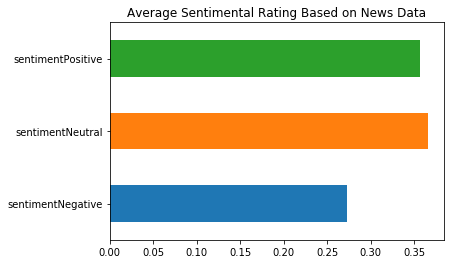

In [34]:
#Explore the attitude prevails in the news based on sentiment rating 
news_train_df[['sentimentNegative', 'sentimentNeutral', 'sentimentPositive']].mean().plot(kind='barh')
plt.title('Average Sentimental Rating Based on News Data')
plt.show()

It appears that the sentimental rating favors towards the positive and neutral side rather than the negative rating side. Let's figure out which companies have the highest positive sentiment versus those with the highest negative sentiment. 

In [67]:
sentiment_avg_by_assetName = news_train_df.groupby('assetName').agg({'sentimentPositive': 'mean', 
                                        'sentimentNeutral': 'mean', 
                                        'sentimentNegative': 'mean'}).reset_index()

print ("Top 10 companies with the highest average positive sentiment are: \n \n", 
      sentiment_avg_by_assetName.sort_values('sentimentPositive', ascending=False)[['assetName', 'sentimentPositive']][:10])

print ("Top 10 companies with the highest average neutral sentiment are: \n \n", 
      sentiment_avg_by_assetName.sort_values('sentimentNeutral', ascending=False)[['assetName', 'sentimentNeutral']][:10])

print ("Top 10 companies with the highest average positive sentiment are: \n \n", 
      sentiment_avg_by_assetName.sort_values('sentimentNegative', ascending=False)[['assetName', 'sentimentNegative']][:10])

Top 10 companies with the highest average positive sentiment are: 
 
                                            assetName  sentimentPositive
8549                                     Trimax Corp           0.855738
8504                  Transamerica Income Shares Inc           0.842674
9428                           iShares MSCI BRIC ETF           0.829031
7513                           Saturns Dpl Cap Tr Ii           0.818061
6225           Nuveen S&P 500 Dynamic Overwrite Fund           0.814941
6167          Nuveen Equity Premium Opportunity Fund           0.809227
8954                                Viventia Bio Inc           0.807838
6164  Nuveen Diversified Currency Opportunities Fund           0.803861
9196                         Wind Energy America Inc           0.803729
244                 Advanced Oxygen Technologies Inc           0.801137
Top 10 companies with the highest average neutral sentiment are: 
 
                                             assetName  sentimentNeutr

Let's now take a look at another variable that is also very interesting to us, the urgency counts of the news data which are are classified into story types which include 1 for alert, 3 for article, and 2 for the others. 

Text(0.5,1,'Urgency Absolute Counts')

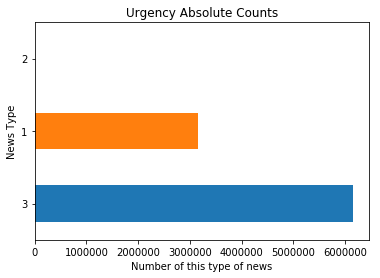

In [35]:
news_train_df['urgency'].value_counts().plot(kind='barh')
plt.xlabel('Number of this type of news')
plt.ylabel('News Type')
plt.title('Urgency Absolute Counts')

According to the graph above, more than 6 millions of these news are articles and more than 3 millions are classified as alert. Interestingly, the urgency '2' is almost never used in comparison to the other two categories. Now let's take a look at the word counts and sentence count in these news data. 

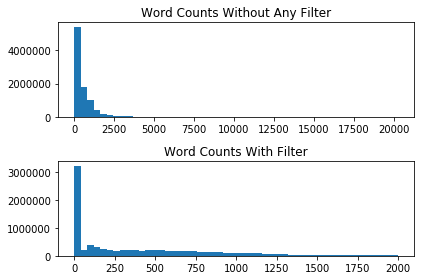

In [36]:
fig, axarr = plt.subplots(2)

#word counts without filter
axarr[0].hist(news_train_df.wordCount.values, bins=50)
axarr[0].set_title('Word Counts Without Any Filter')

#word counts with filter
axarr[1].hist(news_train_df[news_train_df['wordCount'] < 2000].wordCount.values, bins=50)
axarr[1].set_title('Word Counts With Filter')

plt.tight_layout()

In [37]:
news_train_df.wordCount.describe()

count    9.328750e+06
mean     5.804340e+02
std      9.580591e+02
min      1.000000e+00
25%      2.000000e+01
50%      2.590000e+02
75%      7.650000e+02
max      2.026300e+04
Name: wordCount, dtype: float64

The average word counts for these news data is 580 words per news with the median value lies at 259 words. There are quite a bit a outliers in the boxplot graph as seen previously. It is very interesting to point out that the news data has a right-skewed (positive skewness, median < mean) distribution in term of word counts. Let's now combine sentence counts and word counts together by taking the ratio between these two variables. 

Text(0.5,1,'Word Counts Over Sentence Counts With Any Filter')

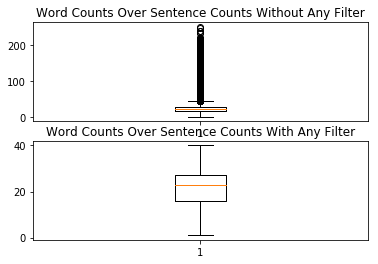

In [38]:
news_train_df['sentence_word_count'] = news_train_df['wordCount']/news_train_df['sentenceCount']

fig = plt.figure()
ax1 = fig.add_subplot(2, 1, 1)
ax1.boxplot(news_train_df['sentence_word_count'].values)
ax1.set_title('Word Counts Over Sentence Counts Without Any Filter')
ax2 = fig.add_subplot(2, 1, 2)
ax2.boxplot(news_train_df[news_train_df['sentence_word_count']<40]['sentence_word_count'].values)
ax2.set_title('Word Counts Over Sentence Counts With Any Filter')

In [39]:
news_train_df['sentence_word_count'].describe()

count    9.328750e+06
mean     2.315733e+01
std      9.928620e+00
min      1.000000e+00
25%      1.620000e+01
50%      2.308333e+01
75%      2.785714e+01
max      2.516923e+02
Name: sentence_word_count, dtype: float64

The average number of words that a sentence would have is about 23 with the median number of words is 23 as well. There are quite of bit of outliers with the maximum number of words go all the way up to 250 and the min number of words is 10. The distribution of the ration between sentence counts and word counts is also positively skewed. 

Text(0.5,1,'Number of news by provider')

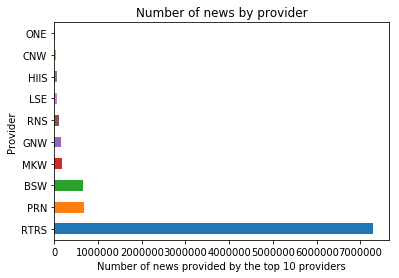

In [40]:
news_train_df['provider'].value_counts().sort_values(ascending=False)[:10].plot(kind='barh')
plt.xlabel('Number of news provided by the top 10 providers')
plt.ylabel('Provider')
plt.title('Number of news by provider')

Text(0,0.5,'News Count')

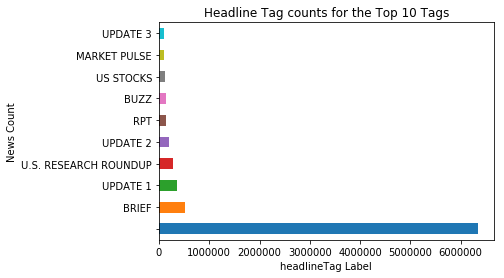

In [41]:
news_train_df['headlineTag'].value_counts().sort_values(ascending=False)[:10].plot('barh')
plt.title('Headline Tag counts for the Top 10 Tags')
plt.xlabel('headlineTag Label')
plt.ylabel('News Count')


RTRS, Reuters, is the most common provider in these news which mostly have untagged headline. Now, last by not least in this exploratory data analysis is to visualize the impact of each word in the headline of the news. In order to do such a task, we will need to dig into some text analytics tool such as scattertext or wordcloud. Let's first use wordcloud to visualize which words are heavily involved in all the headlines related to companies with the highest trading volumes identified above. 

In [50]:
import ast 

#extracting index that has assetCode related to the top 10 companies with the highest trading volume
included_top10_vol_assetCodes_index = []
for i, val in enumerate(news_train_df['assetCodes'].values):
    new_val = ast.literal_eval(val)
    union_lst = list(set(main_assetCode) & new_val)
    if union_lst != []:
        included_top10_vol_assetCodes_index.append(i)

In [53]:
#create a new news training dataframe of the top 10 companies with the highest trading volume
top10_vol_news = news_train_df.iloc[included_top10_vol_assetCodes_index]

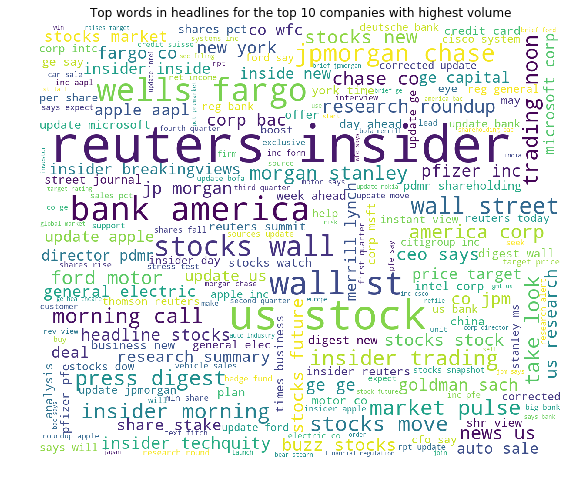

In [59]:
from wordcloud import WordCloud , STOPWORDS
#Create a list of words from the top10_vol_news dataframe
headlines_text = ' '.join(top10_vol_news['headline'].str.lower().values)

#Create the wordcloud object
wordcloud = WordCloud(width=1200, height=1000, margin=0, 
                      background_color='white', stopwords=STOPWORDS).generate(headlines_text)

#Display the generated image:
plt.figure(figsize=(12,8))
plt.imshow(wordcloud)
plt.title('Top words in headlines for the top 10 companies with highest volume')
plt.axis("off")
plt.show()

Through the wordcloud generated images, we can see that "reuters and insider" are the two most important words that were repeatedly mentioned in these headlines related to the top 10 companies with the highest trading volume. This is not very surprising since we found out earlier that Reuters is also the most common provider of these news. Two band names that stand out from this analysis are wells fargo and bank america, which could imply their relation to the volum of trading came from these asset codes. 